<a href="https://colab.research.google.com/github/Guhan2348519/demo/blob/main/2348519_cv_lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

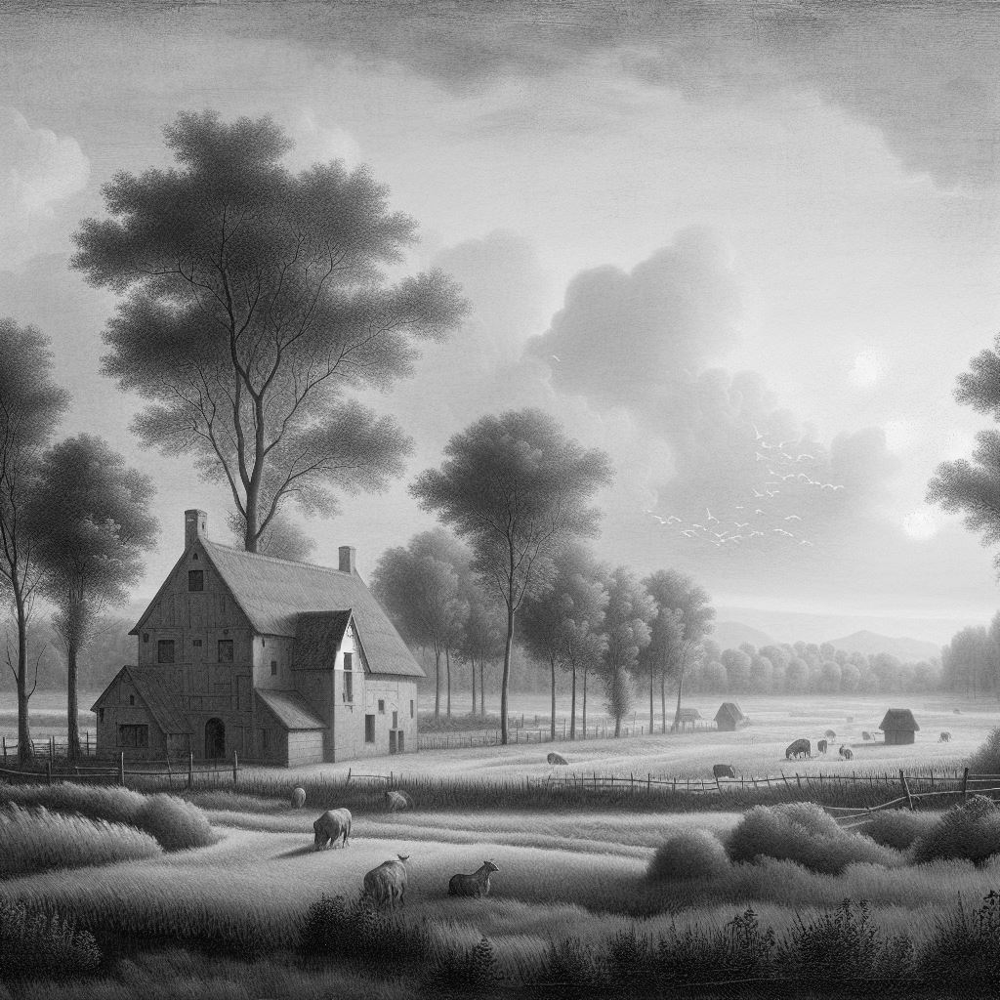

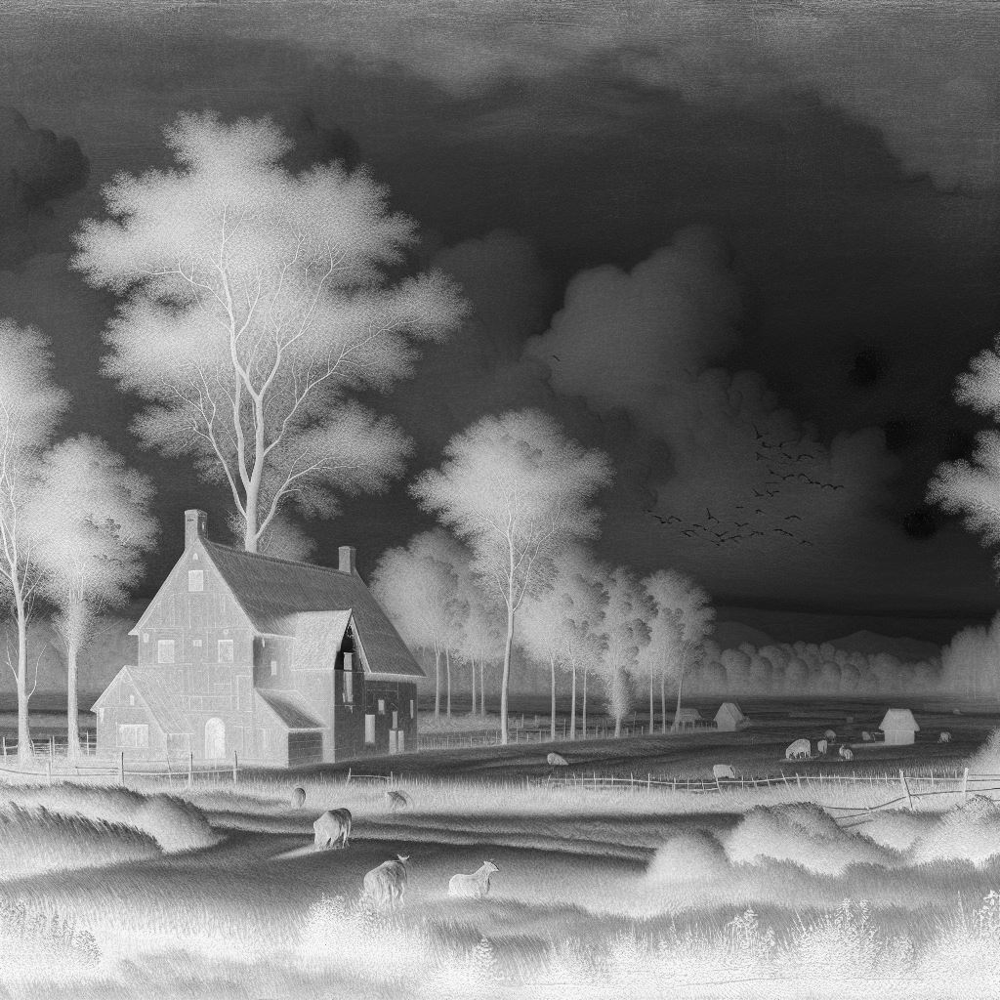

In [1]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
img = cv2.imread('/content/drive/MyDrive/cvimage.jpeg')

# Convert the image to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Calculate the negative of the grayscale image
negative_gray_img = 255 - gray_img

# Display the original grayscale and negative grayscale images using cv2_imshow
cv2_imshow(gray_img)
cv2_imshow(negative_gray_img)

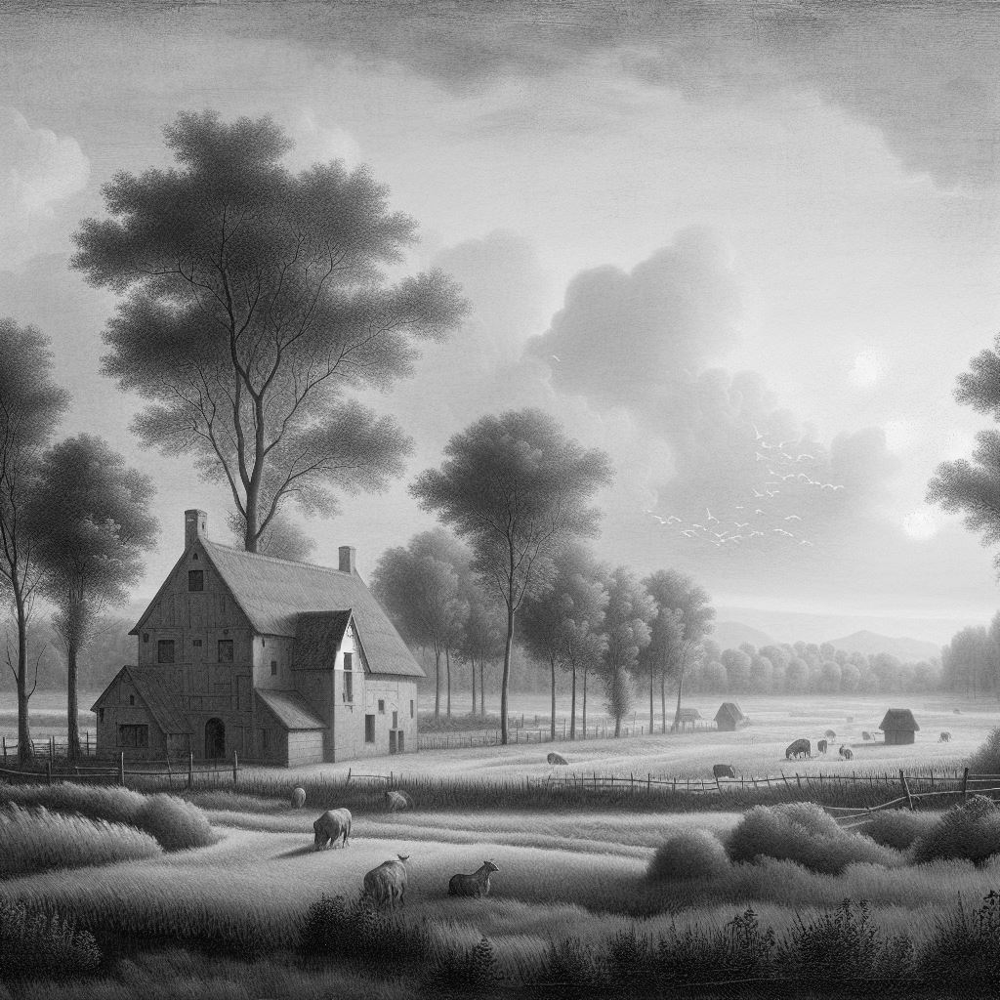

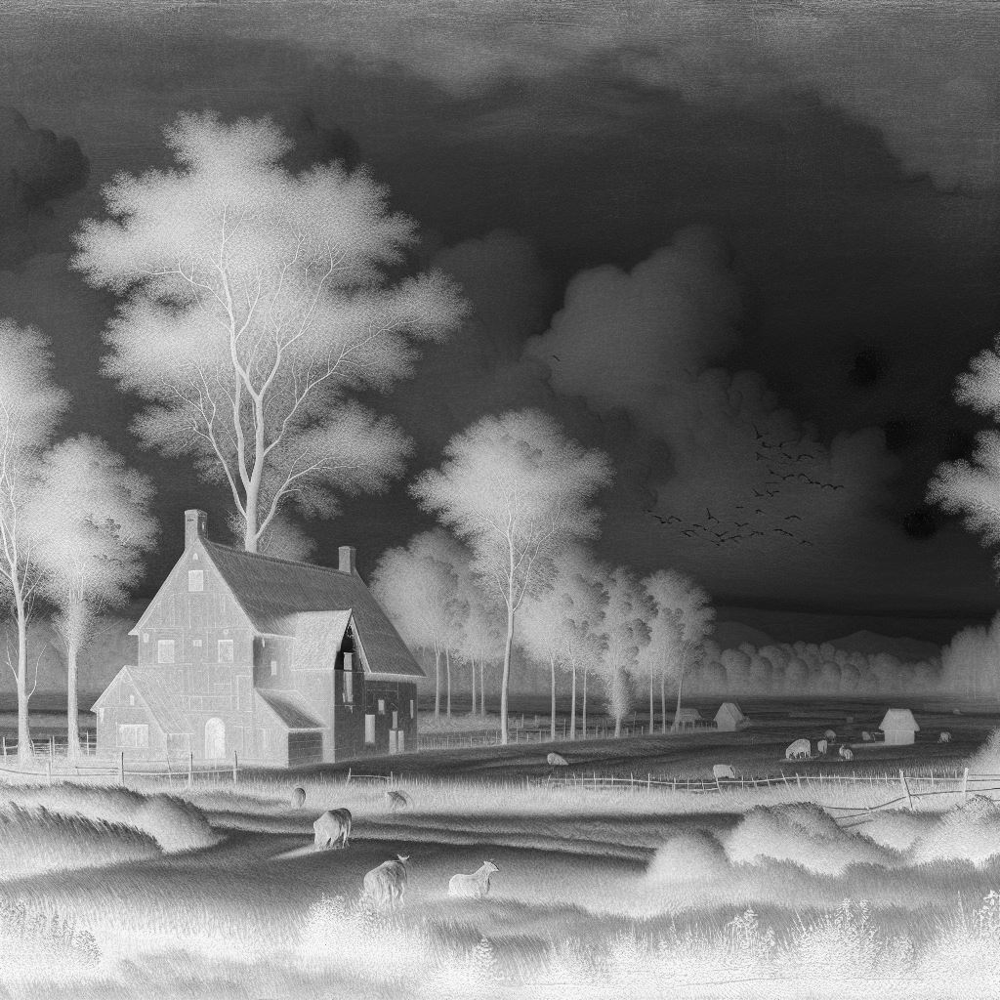

In [8]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # Import cv2_imshow from google.colab.patches

def custom_negative_image(image_path):
    # Read the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create a function to calculate the negative of the grayscale image
    def calculate_negative(pixel_value):
        return 255 - pixel_value

    # Apply the custom function element-wise to the grayscale image
    negative_image = np.vectorize(calculate_negative)(gray_image)

    # Display the original and negative images using cv2_imshow
    cv2_imshow(gray_image)
    cv2_imshow(negative_image)

    # Save the negative image to a file
    cv2.imwrite('custom_negative_image.jpg', negative_image)

# Call the custom function with the input image path
custom_negative_image('/content/drive/MyDrive/cvimage.jpeg')

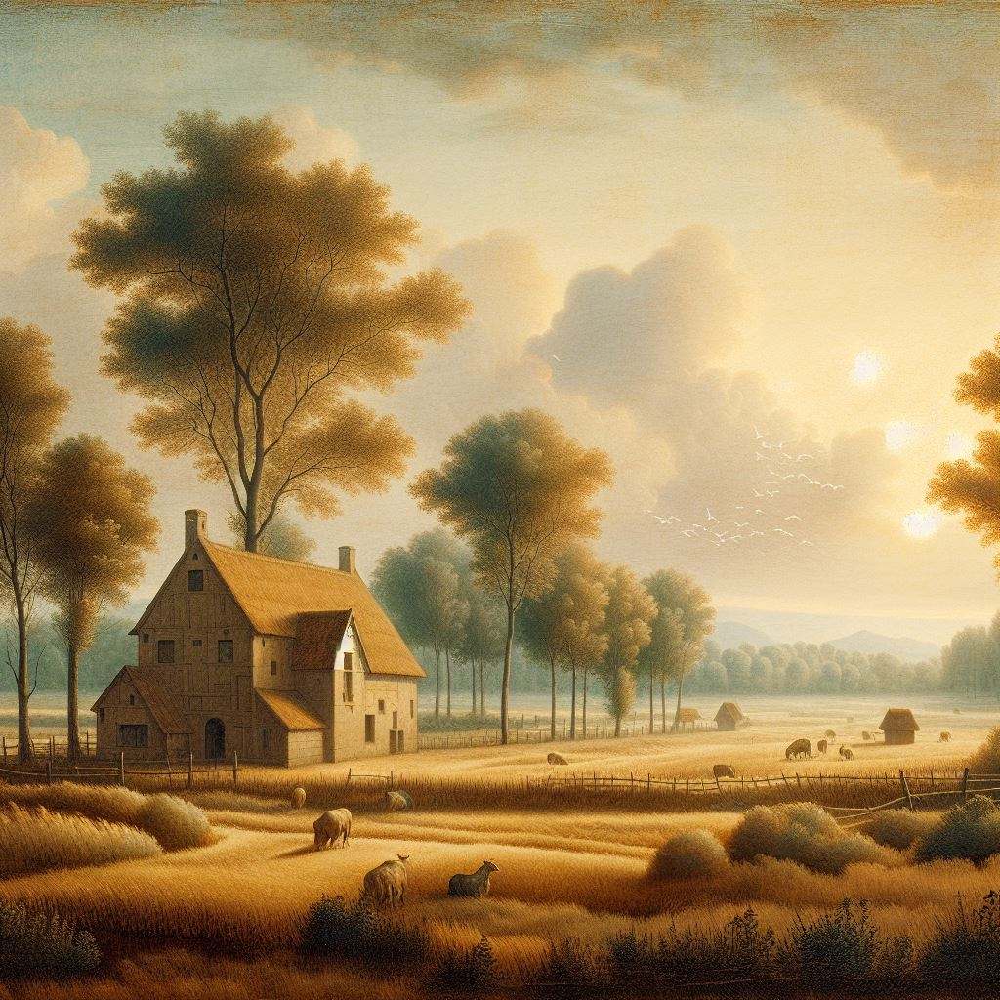

In [3]:
cv2_imshow(img)

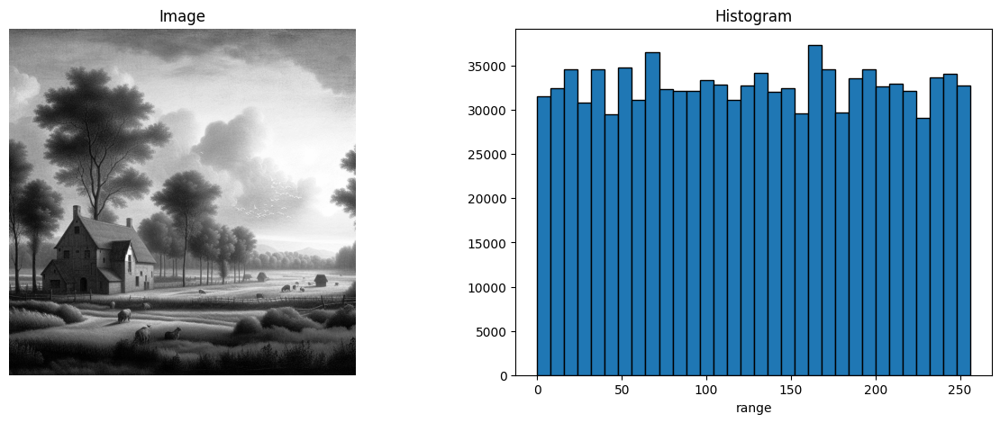

In [23]:

def calculate_hist(gray_img):
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    ax[0].imshow(gray_img, cmap="gray")  # Corrected variable name
    ax[0].axis('off')
    ax[0].set_title("Image")

    ax[1].hist(gray_img.ravel(), bins=32, range=(0.0, 256.0), ec='k') # calculating histogram
    ax[1].set_title("Histogram")
    ax[1].set_xlabel("range")
    plt.show()

# Now, you can call the function as before:
calculate_hist(equalized_gray)

In [19]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # Import cv2_imshow from google.colab.patches

# Load the image
img = cv2.imread('/content/drive/MyDrive/cvimage.jpeg')

# Convert the image to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
equalized_gray_img = cv2.equalizeHist(gray_img)

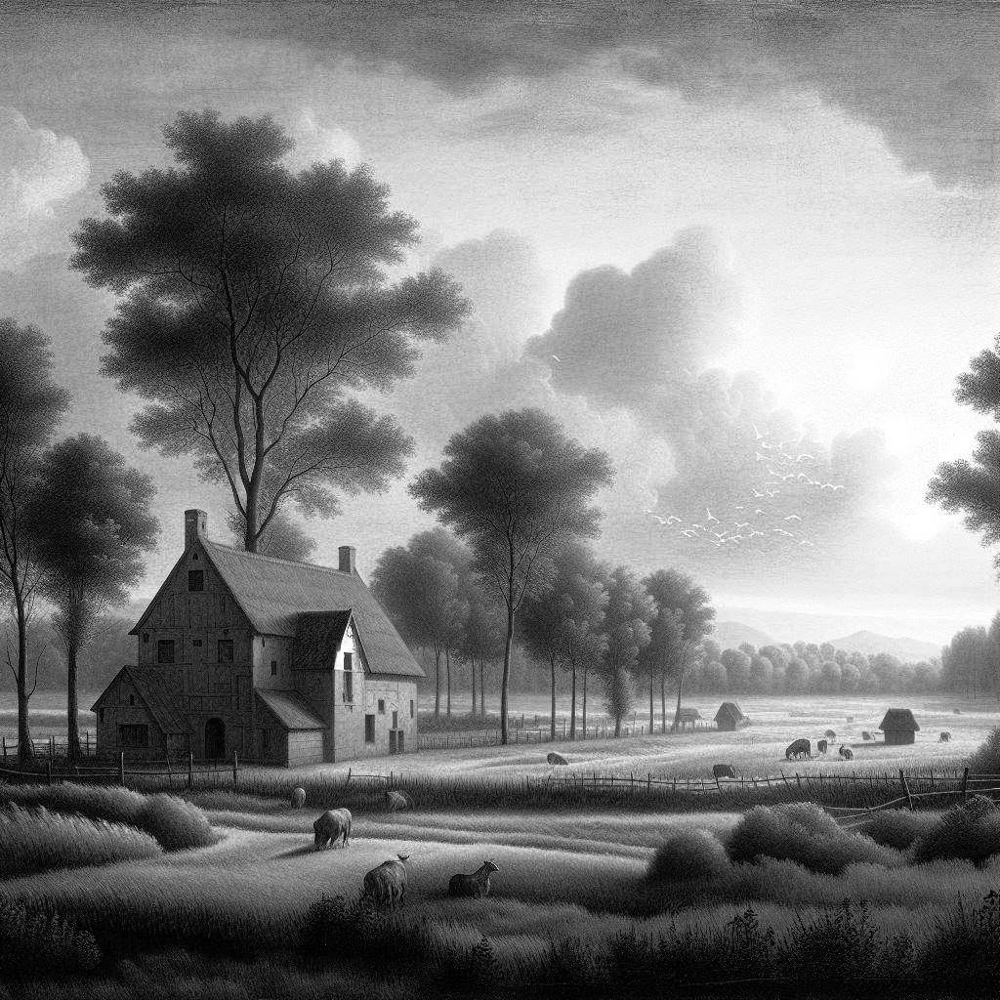

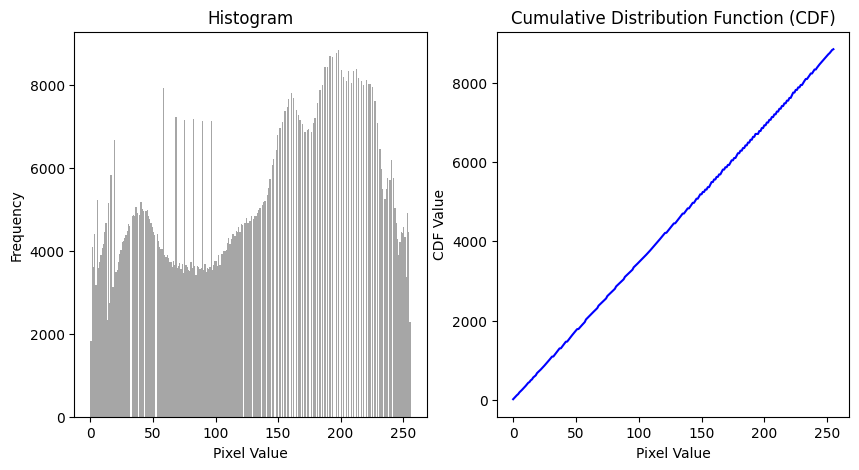

In [25]:
cv2_imshow(equalized_gray_img)  # Display the equalized grayscale image
hist, bins = np.histogram(equalized_gray_img.flatten(), 256, [0, 256])

# Calculate the cumulative distribution function (CDF)
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()

# Plot the histogram and CDF
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(equalized_gray_img.flatten(), 256, [0, 256], color='gray', alpha=0.7)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.plot(cdf_normalized, color='b')
plt.title('Cumulative Distribution Function (CDF)')
plt.xlabel('Pixel Value')
plt.ylabel('CDF Value')

plt.show()

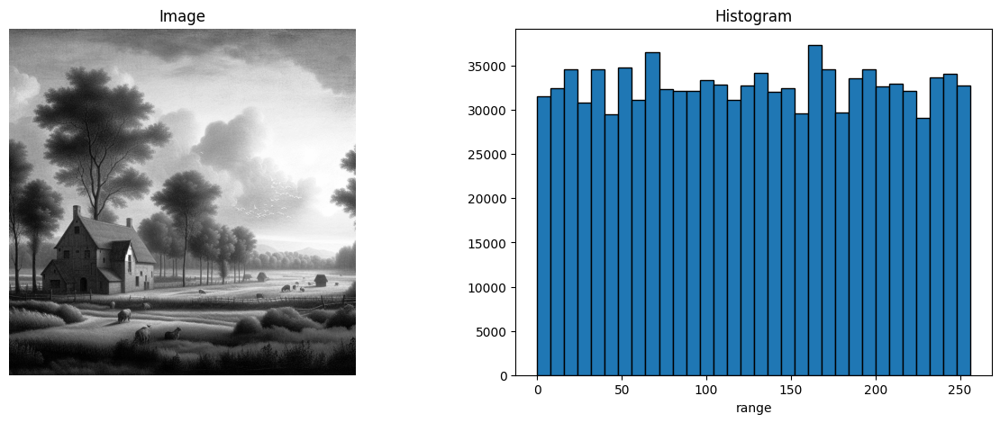

In [24]:

import numpy as np
import matplotlib.pyplot as plt

number_of_bins = 256

def cumulative_distribution(image):
    """
    Calculate the cumulative distribution function (CDF) of the input image.

    :param image: input image (1D array)
    :return: normalized CDF of the input image
    """
    # Initialize histogram array
    img_hist = np.zeros(number_of_bins)

    # Compute histogram
    for pixel in image:
        img_hist[pixel] += 1

    # Calculate cumulative distribution
    img_cdf = img_hist.cumsum()

    # Normalize the CDF
    img_cdf = ((img_cdf - img_cdf.min()) * 255) / (img_cdf.max() - img_cdf.min())
    img_cdf = img_cdf.astype(int)

    return img_cdf

def my_equalizing_histograms(src):
    """
    Perform histogram equalization on the input grayscale image.

    :param src: input grayscale image (2D array)
    :return: histogram equalized image
    """
    img = src.copy()

    # Flatten the image to 1D array
    img_flat = np.asarray(img).flatten()

    # Calculate the cumulative distribution function (CDF)
    cdf = cumulative_distribution(img_flat)

    # Apply histogram equalization
    equalized_img_flat = cdf[img_flat]

    # Reshape and de-normalize the equalized image
    equalized_img = equalized_img_flat.reshape(src.shape)

    return equalized_img

# Assuming 'gray_img' is the grayscale image you want to equalize
equalized_gray = my_equalizing_histograms(gray_img)

# Visualize the histogram of the equalized grayscale image
calculate_hist(equalized_gray)

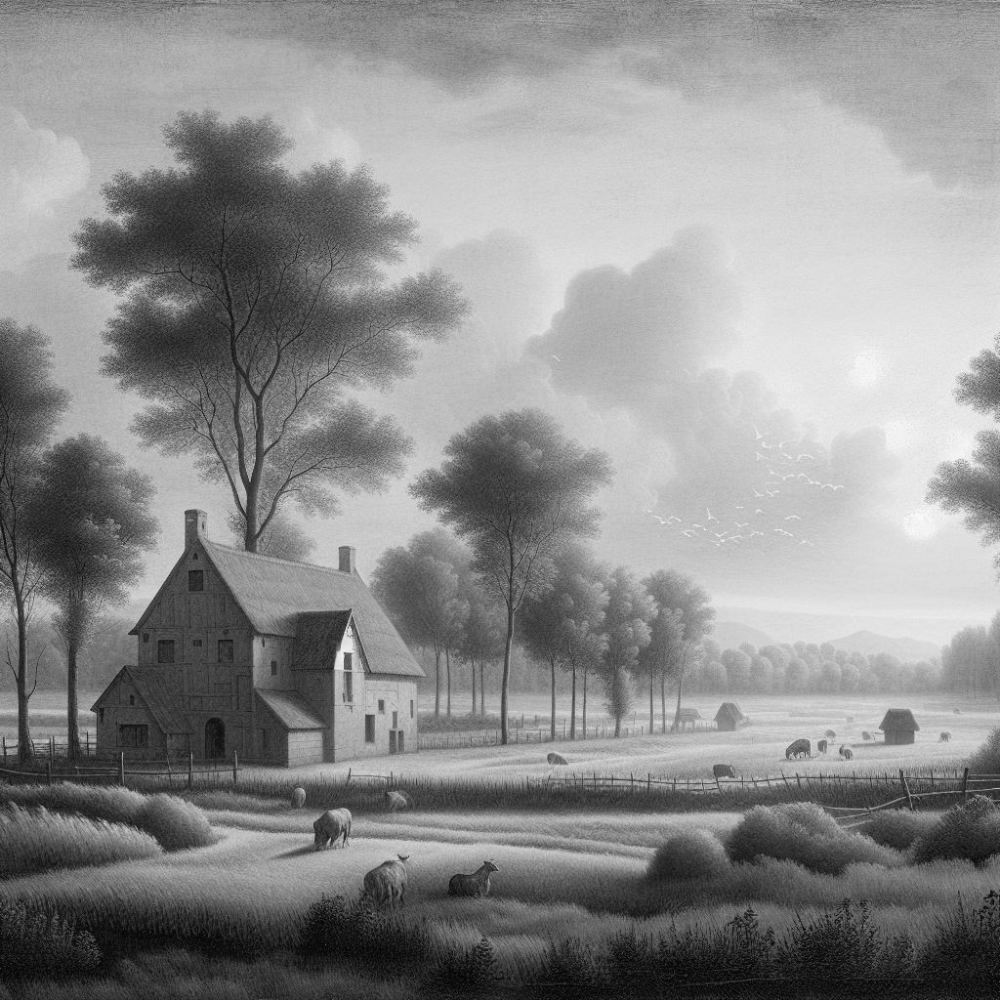

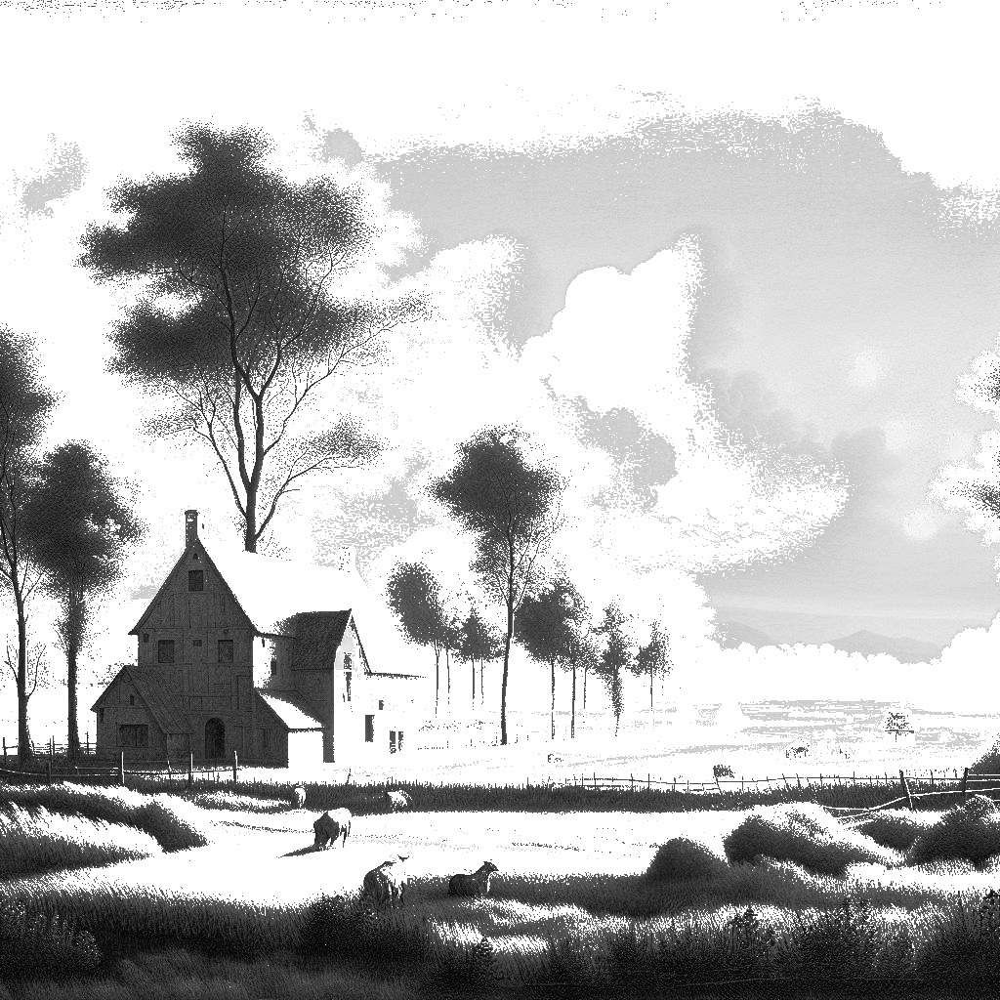

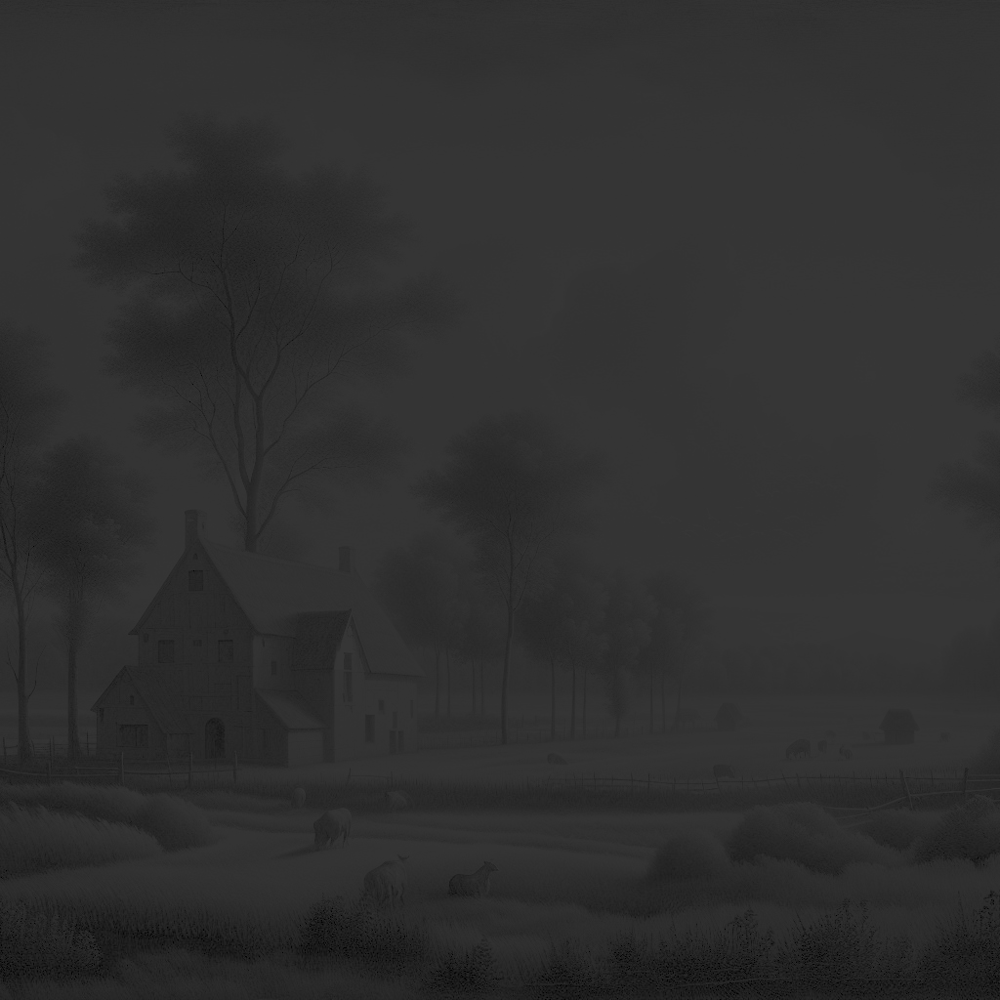

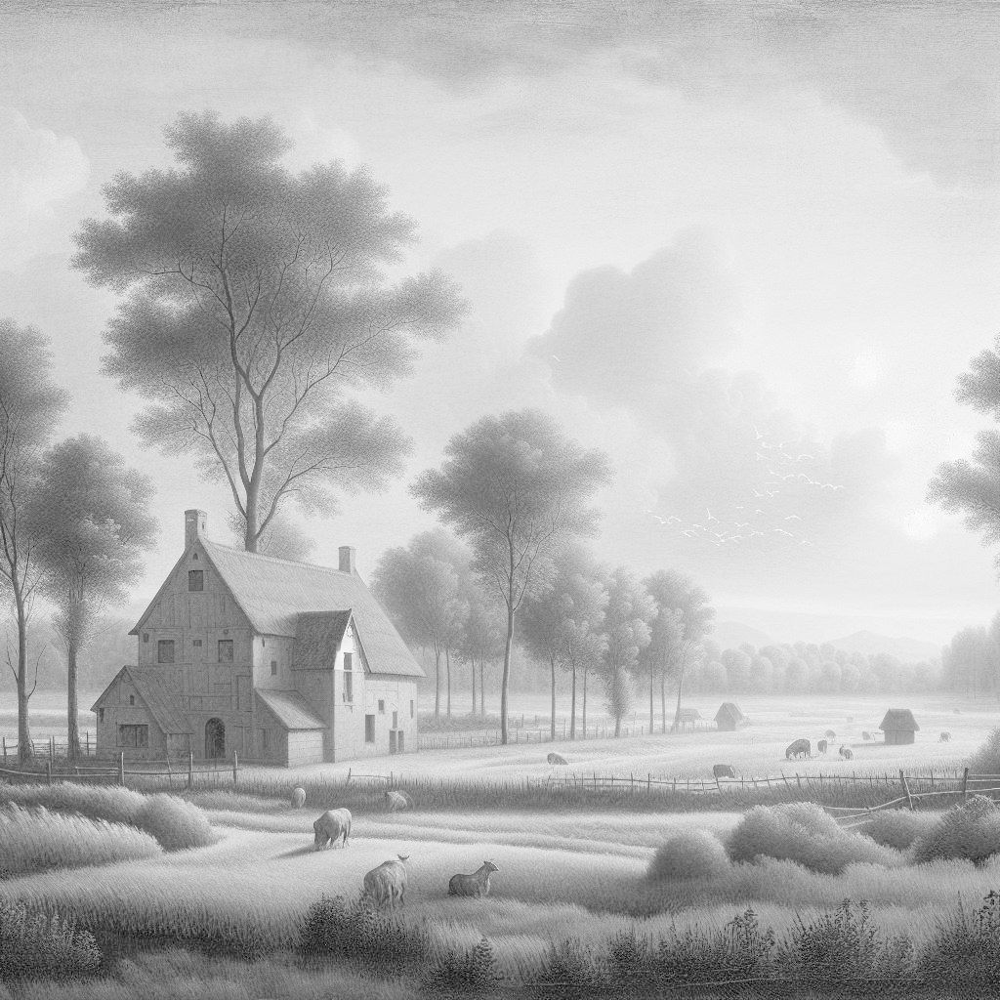

In [28]:

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image
img = cv2.imread('/content/drive/MyDrive/cvimage.jpeg', cv2.IMREAD_GRAYSCALE)

# Apply linear gray scale slicing
linear_sliced_img = np.copy(img)
linear_sliced_img[(linear_sliced_img >= 100) & (linear_sliced_img <= 200)] = 255

# Apply logarithmic gray scale slicing
c = 10
log_sliced_img = c * np.log1p(img)

# Apply power-law gray scale slicing
gamma = 0.5
powerlaw_sliced_img = np.power(img, gamma)
powerlaw_sliced_img = cv2.normalize(powerlaw_sliced_img, None, 0, 255, cv2.NORM_MINMAX)
powerlaw_sliced_img = np.uint8(powerlaw_sliced_img)

# Display the images
cv2_imshow(img)
cv2_imshow(linear_sliced_img)
cv2_imshow(log_sliced_img)
cv2_imshow(powerlaw_sliced_img)

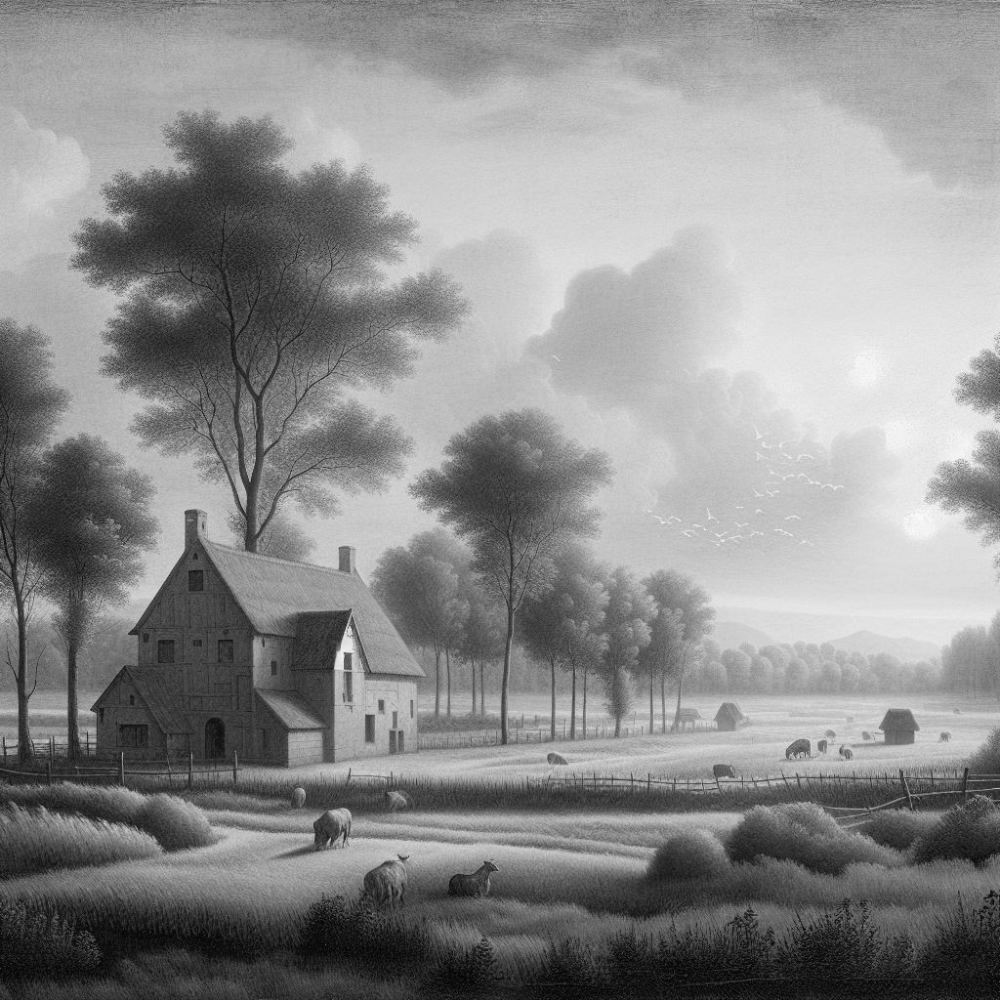

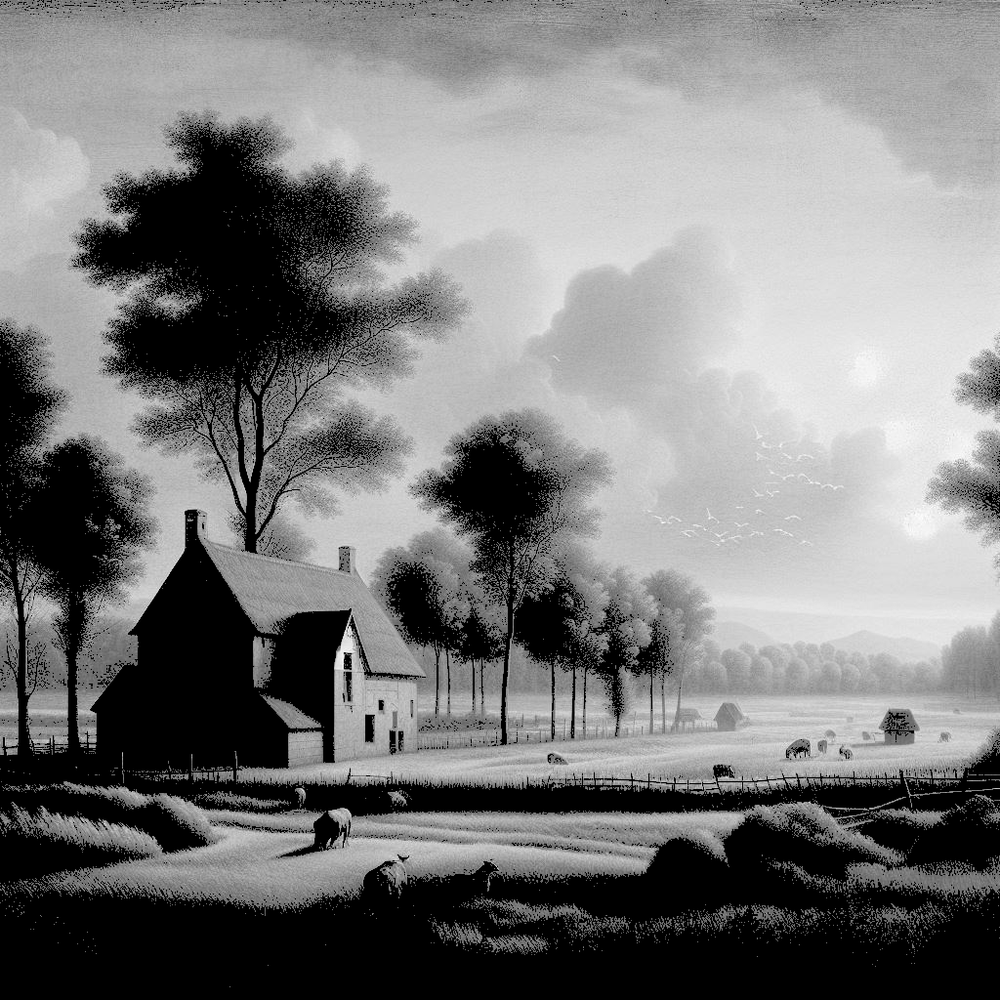

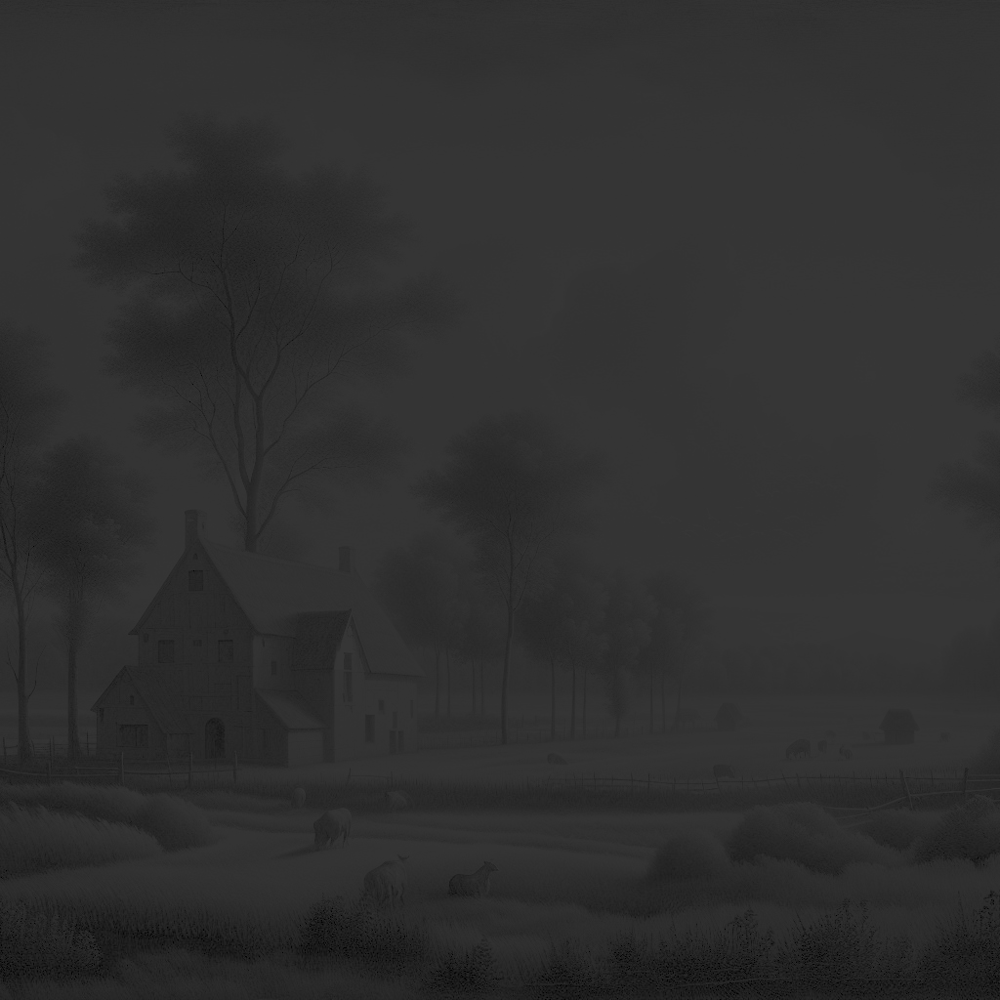

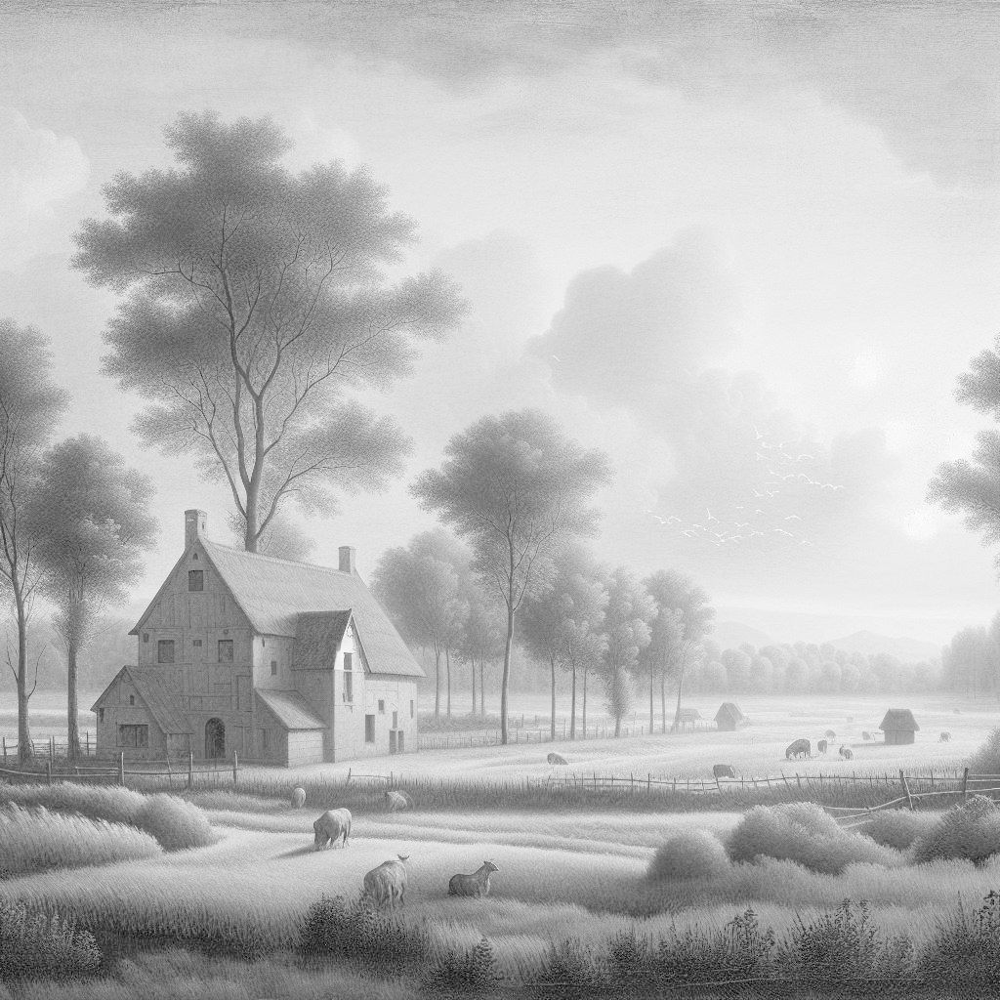

In [31]:

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def linear_slice(image, low, high):
    """
    Apply linear gray scale slicing to the input image.

    :param image: input image (grayscale)
    :param low: lower threshold
    :param high: higher threshold
    :return: sliced image
    """
    # Apply thresholding to create a mask
    _, mask = cv2.threshold(image, low, high, cv2.THRESH_BINARY)

    # Bitwise AND operation to get the sliced image
    sliced_image = cv2.bitwise_and(image, image, mask=mask)

    return sliced_image

def logarithmic_slice(image, c=10):
    """
    Apply logarithmic gray scale slicing to the input image.

    :param image: input image (grayscale)
    :param c: constant multiplier for adjusting contrast
    :return: sliced image
    """
    # Apply logarithmic transformation
    sliced_image = c * np.log1p(image)

    # Convert back to uint8
    sliced_image = np.uint8(sliced_image)

    return sliced_image

def powerlaw_slice(image, gamma):
    """
    Apply power-law gray scale slicing to the input image.

    :param image: input image (grayscale)
    :param gamma: gamma value for adjusting contrast
    :return: sliced image
    """
    # Apply power-law transformation
    sliced_image = np.power(image, gamma)

    # Normalize the image
    sliced_image = cv2.normalize(sliced_image, None, 0, 255, cv2.NORM_MINMAX)

    # Convert to uint8
    sliced_image = np.uint8(sliced_image)

    return sliced_image

# Load the image
img = cv2.imread('/content/drive/MyDrive/cvimage.jpeg', cv2.IMREAD_GRAYSCALE)

# Apply linear gray scale slicing
linear_sliced_img = linear_slice(img, 100, 200)

# Apply logarithmic gray scale slicing
log_sliced_img = logarithmic_slice(img)

# Apply power-law gray scale slicing
powerlaw_sliced_img = powerlaw_slice(img, 0.5)

# Display the images
cv2_imshow(img)
cv2_imshow(linear_sliced_img)
cv2_imshow(log_sliced_img)
cv2_imshow(powerlaw_sliced_img)